In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
from pathlib import Path
from typing import Union, List, Tuple

from utils import xml_timeinfo, xml_parameters, read_tss, KGEmod

## Configuration

In [5]:
PATH_GLOFAS = Path('Z:/nahaUsers/casadje/GloFASv4/LisfloodPL')

In [6]:
parameter_range = {
    'UZTC': [0.01, 40],
    'LZTC': [40, 1000],
    'GwPercValue': [0.01, 2],
    'LZthreshold': [0, 30],
    'b_Xinanjiang': [0.01, 5],
    'PowerPrefFlow': [0.5, 8],
    'SnowMeltCoef': [2.5, 6.5],
    'CalChanMan1': [0.5, 2],
    'CalChanMan2': [0.5, 5],
    'LakeMultiplier': [0.5, 2],
    'adjustNormalFlood': [0.01, 0.99],
    'ReservoirRnormqMult': [0.25, 2],
    'QSplitMult': [0, 20],
    'GwLoss': [0, 0.5],
}

## Load results

In [7]:
basin_ids = list(set([int(entry.stem) for entry in PATH_GLOFAS.iterdir() if entry.is_dir()]))
print(f'{len(basin_ids)} basins')

739 basins


### Performance

In [10]:
try:
    performance = {key: pd.read_csv(f'performance_{key}.csv', index_col='basin_id') for key in ['glofas', 'pl']}
except:
    df =  pd.DataFrame(columns=['KGE', 'alpha', 'beta', 'r'], dtype=float)
    df.index.name = 'basin_id'
    performance = {key: df for key in ['glofas', 'pl']}

    for basin_id in tqdm(basin_ids):

        # load observed discharge
        obs = pd.read_csv(PATH_GLOFAS / f'{basin_id:04}' / 'station' / 'observations.csv', parse_dates=True, dayfirst=True, index_col=0).squeeze()
        obs.name = 'obs'

        # GloFAS
        # ------

        # performance of the simulated discharge
        tss = PATH_GLOFAS / f'{basin_id:04}' / 'out' / 'disX.tss'
        xml = PATH_GLOFAS / f'{basin_id:04}' / 'settings' / 'settings_lisflood_wusewregion_FULLinit_GloFASnext-RunX.xml'
        sim = read_tss(tss, xml)
        sim.name = basin_id
        performance['glofas'].loc[basin_id,:] = KGEmod(obs, sim)

        del tss, xml, sim

        # Parameter Learning
        # ------------------

        # performance of the simulated discharge
        tss = PATH_GLOFAS / f'{basin_id:04}' / 'out_pl' / 'disX.tss'
        xml = list((PATH_GLOFAS / f'{basin_id:04}' / 'settings').glob('settings_pl_basin_params_*-RunX.xml'))[0]
        sim = read_tss(tss, xml)
        sim.name = basin_id
        performance['pl'].loc[basin_id,:] = KGEmod(obs, sim)

        del tss, xml, sim, pars

    # export
    for key, df in performance.items():
        df.to_csv(f'performance_{key}.csv')

### Parameters

In [12]:
try:
    parameters = {key: pd.read_csv(f'parameters_{key}.csv', index_col='basin_id') for key in ['glofas', 'pl']}
except:
    df = pd.DataFrame(columns=list(parameter_range), dtype=float)
    df.index.name = 'basin_id'
    parameters = {cal: df for cal in ['glofas', 'pl']}
    for basin_id in tqdm(basin_ids):

        # GloFAS
        # ------

        # calibrated parameters
        xml = PATH_GLOFAS / f'{basin_id:04}' / 'settings' / 'settings_lisflood_wusewregion_FULLinit_GloFASnext-RunX.xml'
        pars = xml_parameters(xml)
        pars.name = basin_id
        parameters['glofas'] = pd.concat((parameters['glofas'], pd.DataFrame(pars).transpose()), axis=0)

        del tss, xml, sim, pars

        # Parameter Learning
        # ------------------

        # estimated parameters
        xml = list((PATH_GLOFAS / f'{basin_id:04}' / 'settings').glob('settings_pl_basin_params_*-RunX.xml'))[0]
        pars = xml_parameters(xml)
        pars.name = basin_id
        parameters['pl'] = pd.concat((parameters['pl'], pd.DataFrame(pars).transpose()), axis=0)

        del tss, xml, sim, pars

    # export
    for key, df in parameters.items():
        df.to_csv(f'parameters_{key}.csv')

### Carlo's summary

In [13]:
# # load results from Carlo
# results = pd.read_excel('kge_results_basin_params_teststep1c_continueEp39_full 1.xlsx', index_col='basin_id')
# results = results.loc[basin_ids]

# results.head()

## Analysis

### Performance

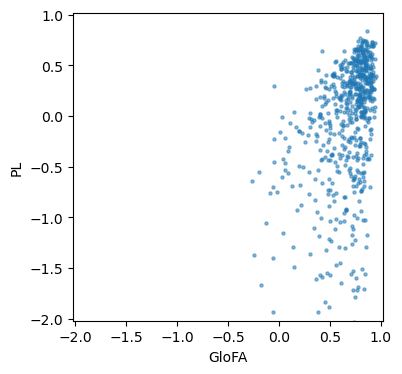

In [25]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(performance['glofas'].KGE,
           performance['pl'].KGE,
           s=5,
           alpha=.5)
ax.set(xlim=(-2.02, 1.02),
       xlabel='GloFAS',
       ylim=(-2.02, 1.02),
       ylabel='PL');

### Parameters

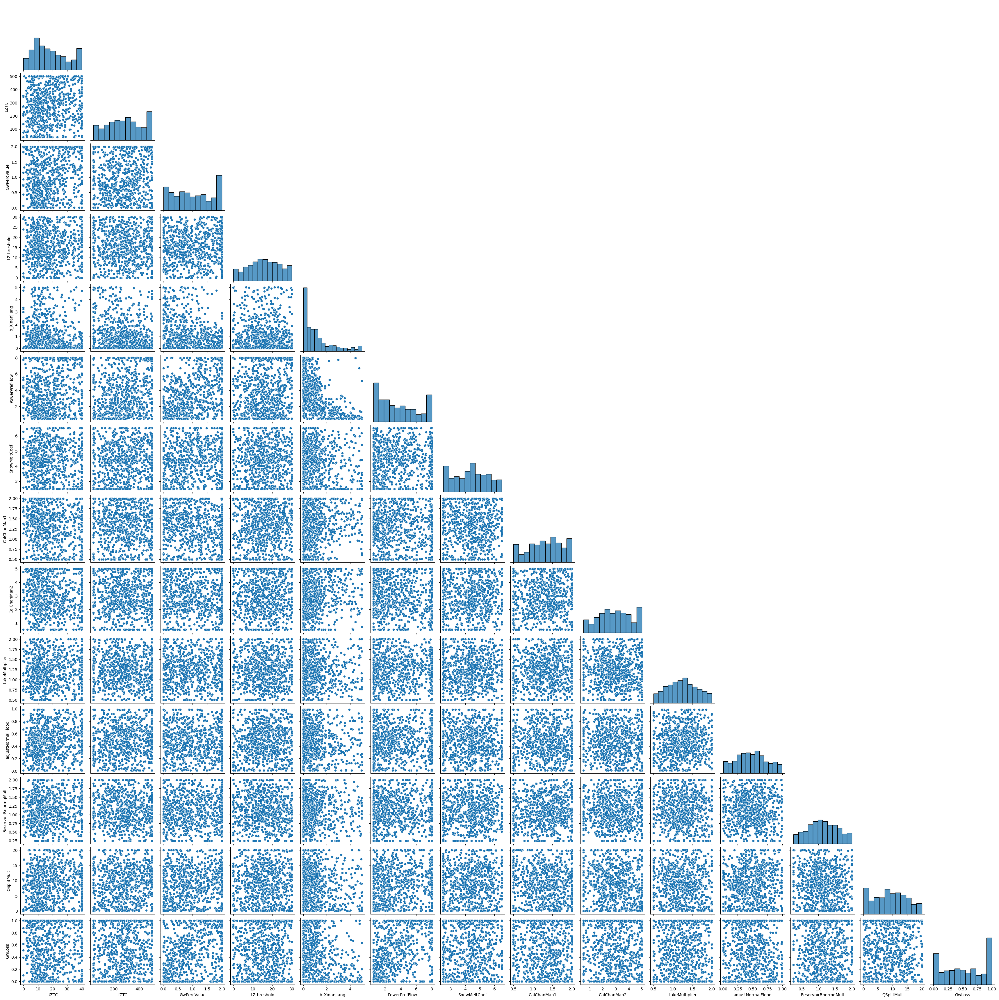

In [27]:
sns.pairplot(parameters['glofas'], corner=True)

In [29]:
pars = parameters['pl']

pars.head()

,UZTC,LZTC,GwPercValue,LZthreshold,b_Xinanjiang,PowerPrefFlow,SnowMeltCoef,CalChanMan1,CalChanMan2,LakeMultiplier,adjustNormalFlood,ReservoirRnormqMult,QSplitMult,GwLoss
basin_id,,,,,,,,,,,,,,
9,35.046978,174.100523,0.689483,6.965992,0.336027,7.639575,5.196767,1.337693,1.467840,0.820688,0.480303,0.334631,3.016141,0.123516
10,33.534877,178.863954,0.625290,7.590296,0.225801,7.708715,5.095005,1.400390,1.625721,0.851731,0.471822,0.331356,4.047670,0.120759
12,15.423679,224.775875,1.255312,13.198286,1.321293,6.417544,4.072577,1.528349,3.189596,1.602106,0.354141,0.761762,9.842862,0.301349
13,18.194817,224.130591,1.077661,14.428521,2.115435,6.192758,3.619454,1.434070,2.826215,1.613151,0.488519,0.728735,8.985471,0.269300
18,21.342455,338.199054,0.936555,24.759178,3.618968,5.071858,4.466213,1.267410,2.737210,1.563101,0.455887,0.718071,3.805020,0.509321


In [55]:
for parname, parrange in parameter_range.items():
    maskmin = parrange[0] <= pars[parname]
    maskmax = pars[parname] <= parrange[1]
    if all(maskmin & maskmax):
        continue
    else:
        print(parname)
        if sum(~maskmin) > 0:
            print(f'{sum(~maskmin)} basins have a {parname} below the lower limit')
        if sum(~maskmax) > 0:
            print(sum(~maskmax), 'basins have a parameter value over the lower limit')

LZTC
1 basins have a LZTC below the lower limit
SnowMeltCoef
1 basins have a parameter value over the lower limit
CalChanMan1
1 basins have a parameter value over the lower limit
LakeMultiplier
1 basins have a LakeMultiplier below the lower limit
GwLoss
306 basins have a parameter value over the lower limit


[Text(0.5, 0, 'GloFAS'), Text(0, 0.5, 'PL')]

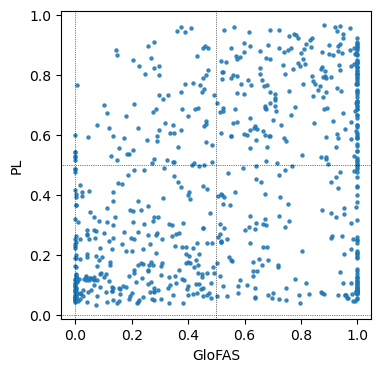

In [60]:
par = 'GwLoss'

fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(parameters['glofas'][par], parameters['pl'][par], s=5, alpha=0.8)
for v in parameter_range[par]:
    ax.axhline(v, c='k', ls=':', lw=.5)
    ax.axvline(v, c='k', ls=':', lw=.5)
ax.set(xlabel='GloFAS',
       ylabel='PL')

In [63]:
parameters['pl'][par].min()

0.0328070637957585

In [61]:
parameters['glofas'][par]

basin_id
9       0.050793
10      0.003686
12      0.513496
13      0.039799
18      0.483626
          ...   
2010    0.899262
2013    0.611341
2014    0.000000
6111    1.000000
2017    0.818866
Name: GwLoss, Length: 739, dtype: float64

In [54]:
print(f'{sum(~maskmin)} basins have a {parname} below the lower limit')

0 basins have a GwLoss below the lower limit


In [49]:
sum(maskmin)

738

In [50]:
sum(~maskmin)

1

In [51]:
sum(maskmax)

739

In [46]:
sum(~maskmax)

306

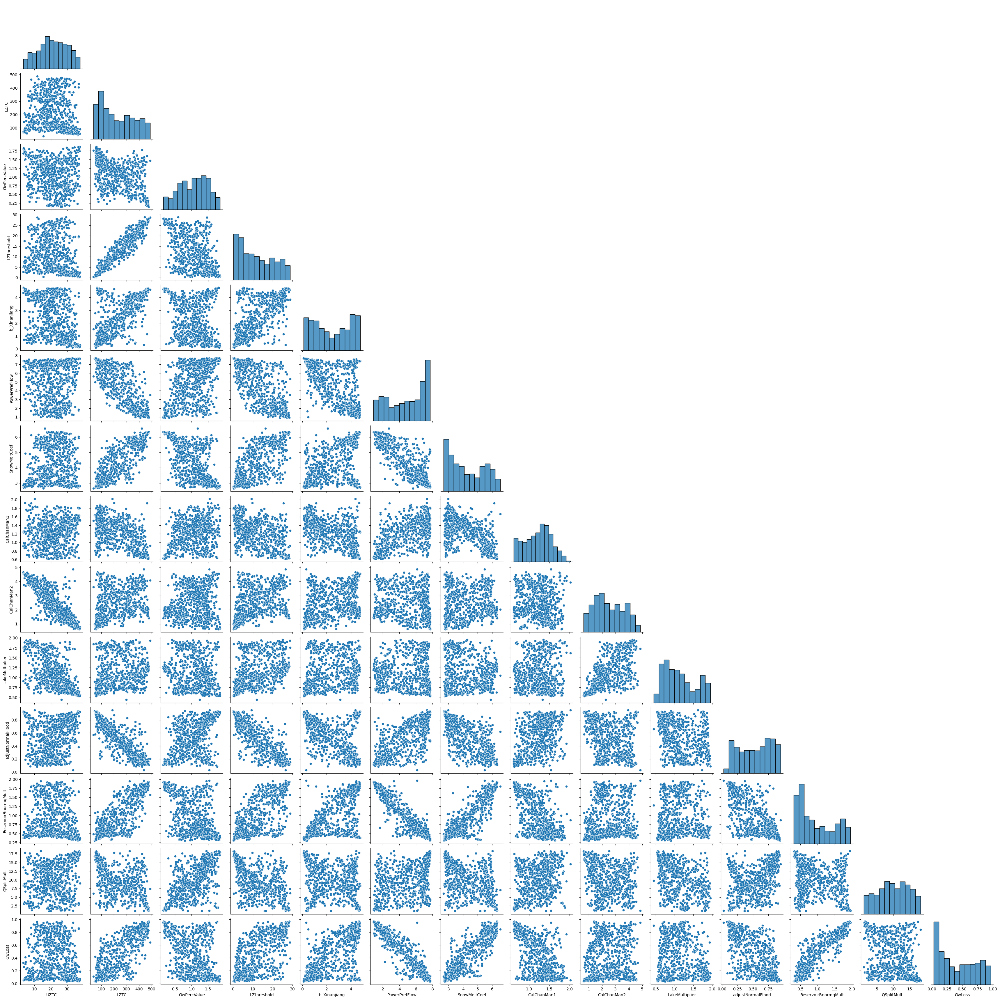

In [28]:
sns.pairplot(parameters['pl'], corner=True)

,adjustNormalFlood,b_Xinanjiang,CalChanMan1,CalChanMan2,GwLoss,GwPercValue,LakeMultiplier,LZTC,LZthreshold,PowerPrefFlow,...,aKGE_sim,r_sim,B_sim,y_sim,se_sim,aKGE,r,B,y,se
basin_id,,,,,,,,,,,,,,,,,,,,,
9,0.480303,0.336027,1.337693,1.467840,0.123516,0.689483,0.820688,174.100523,6.965992,7.639575,...,0.085309,0.650860,0.910928,0.159270,2.176108e+05,0.044731,0.589097,0.817244,0.157208,1.276009e+05
10,0.471822,0.225801,1.400390,1.625721,0.120759,0.625290,0.851731,178.863954,7.590296,7.708715,...,0.130321,0.711594,0.841100,0.195069,1.533649e+06,0.082435,0.667227,0.741155,0.185023,1.050343e+06
12,0.354141,1.321293,1.528349,3.189596,0.301349,1.255312,1.602106,224.775875,13.198286,6.417544,...,0.439444,0.668752,0.939179,1.448106,3.859545e+05,0.267713,0.341865,0.853745,1.285852,1.455300e+05
13,0.488519,2.115435,1.434070,2.826215,0.269300,1.077661,1.613151,224.130591,14.428521,6.192758,...,0.663796,0.951546,0.772902,1.243129,1.549815e+06,0.573653,0.789975,0.780953,1.299466,9.082408e+05
18,0.455887,3.618968,1.267410,2.737210,0.509321,0.936555,1.563101,338.199054,24.759178,5.071858,...,0.338063,0.610801,0.936403,1.531639,7.281915e+06,0.215753,0.314838,0.787518,1.316934,3.631262e+06


In [3]:
results.columns

Index(['adjustNormalFlood', 'b_Xinanjiang', 'CalChanMan1', 'CalChanMan2',
       'GwLoss', 'GwPercValue', 'LakeMultiplier', 'LZTC', 'LZthreshold',
       'PowerPrefFlow', 'QSplitMult', 'ReservoirRnormqMult', 'SnowMeltCoef',
       'UZTC', 'aKGE_sim', 'r_sim', 'B_sim', 'y_sim', 'se_sim', 'aKGE', 'r',
       'B', 'y', 'se'],
      dtype='object')

In [7]:
results.describe()

,adjustNormalFlood,b_Xinanjiang,CalChanMan1,CalChanMan2,GwLoss,GwPercValue,LakeMultiplier,LZTC,LZthreshold,PowerPrefFlow,...,aKGE_sim,r_sim,B_sim,y_sim,se_sim,aKGE,r,B,y,se
count,739.000000,739.000000,739.000000,739.000000,739.000000,739.000000,739.000000,739.000000,739.000000,739.000000,...,739.000000,739.000000,739.000000,739.000000,7.390000e+02,739.000000,739.000000,739.000000,739.000000,7.390000e+02
mean,0.536782,2.433874,1.218098,2.513586,0.420235,1.057318,1.130930,227.318329,11.849481,4.916025,...,-0.516576,0.727814,1.970129,1.291629,2.297074e+06,-0.831198,0.556901,2.152056,1.303596,1.373157e+06
std,0.255670,1.502116,0.320584,1.081396,0.295433,0.429849,0.405901,130.688943,8.387467,2.175050,...,2.388054,0.180787,2.497461,0.796338,4.203635e+06,2.649856,0.183944,2.766156,1.037393,2.736305e+06
min,0.027184,0.093312,0.616951,0.618579,0.032807,0.146970,0.443580,37.169244,0.241630,0.883118,...,-24.273737,0.054956,0.001599,0.159270,2.642197e+02,-26.465613,-0.011296,0.000927,0.042983,2.993335e+02
25%,0.301957,0.998325,0.962920,1.595375,0.127676,0.720156,0.782163,102.468548,4.078355,2.764917,...,-0.508140,0.628030,0.912508,0.836406,4.754754e+05,-0.738829,0.450062,0.881140,0.749813,2.185961e+05
50%,0.564958,2.368973,1.253614,2.363422,0.366038,1.096232,1.068104,199.710924,10.205626,5.330013,...,0.220812,0.761334,1.244660,1.129409,1.103626e+06,0.036158,0.587525,1.288907,1.046613,6.880699e+05
75%,0.768466,3.952749,1.455090,3.472351,0.689988,1.409310,1.441868,338.288911,19.418293,6.990971,...,0.532374,0.863677,1.826484,1.552052,2.333083e+06,0.376303,0.688842,2.191235,1.531872,1.465254e+06
max,0.948431,4.763281,2.016737,4.861421,0.966424,1.867517,1.952647,487.098941,28.822551,7.717629,...,0.984986,0.995739,26.262531,8.186961,4.142077e+07,0.838083,0.933615,28.456239,11.399769,4.958737e+07


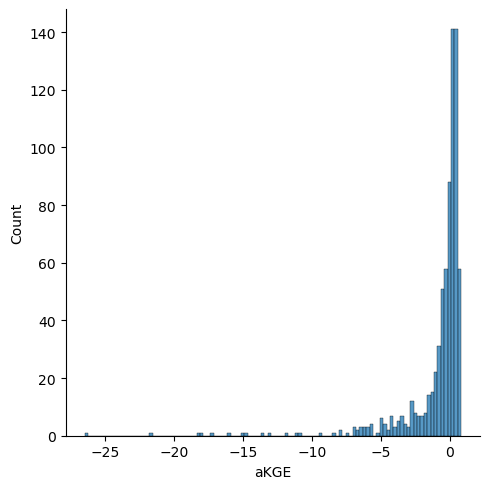

In [5]:
sns.displot(results.aKGE)

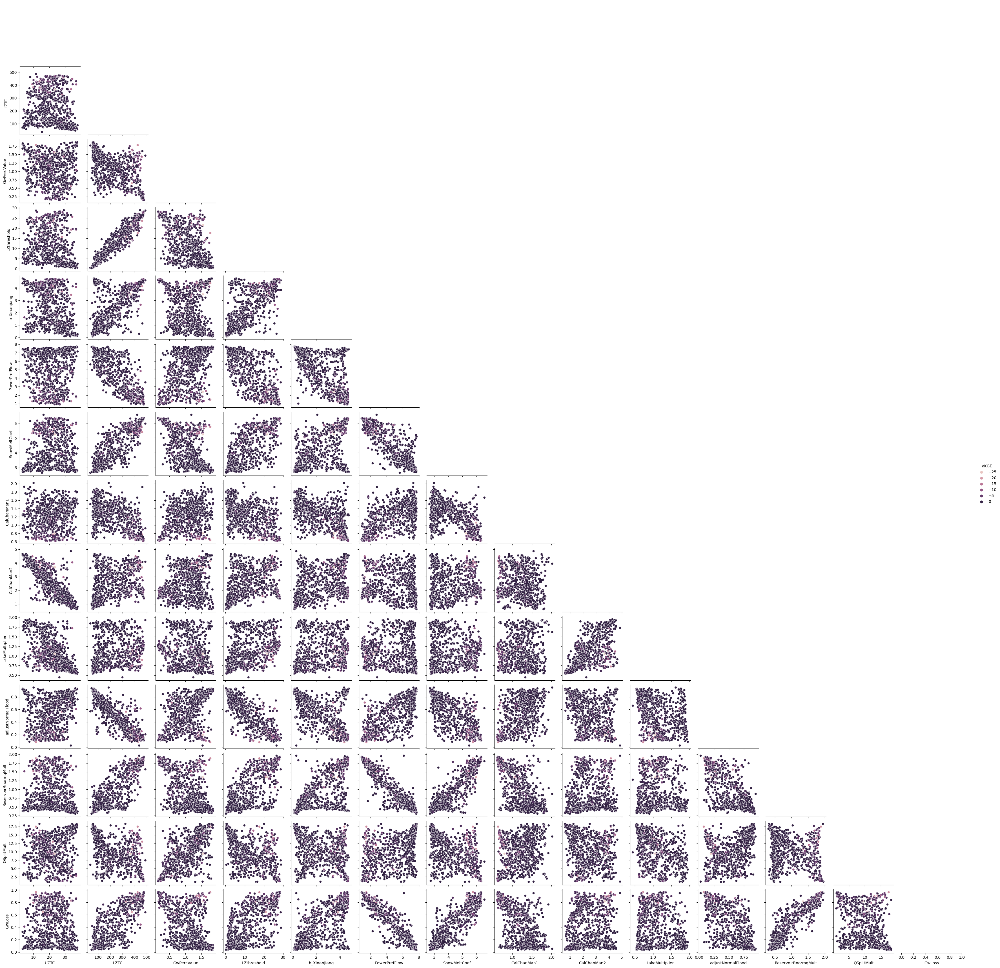

In [5]:
sns.pairplot(results, vars=list(parameter_range), corner=True, hue='aKGE')